**ANALYSIS TO FIND CORRELATION BETWEEN 
UNDERARMOUR REVENUE AND SOCIAL DATA** 

Stages of the problem:


1.  DATA CLEANING
2.  EXPLORATORY DATA ANALYSIS
3.  RESULTS AND EVALUATION

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import statsmodels.api as sm

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
df_fb = pd.read_csv('/content/drive/MyDrive/nike_ua_project/underarmour/ua_fb.csv')
df_ig = pd.read_csv('/content/drive/MyDrive/nike_ua_project/underarmour/ua_ig.csv')
df_yt = pd.read_csv('/content/drive/MyDrive/nike_ua_project/underarmour/ua_yt.csv')
df_twt = pd.read_csv('/content/drive/MyDrive/nike_ua_project/underarmour/ua_tw.csv')

# DATA CLEANING AND PREPARING

The date in social data is not a quarterly date and the revenue data contains date in quarterly format. Hence, created a function to convert the daily date format into quarterly.

In [4]:
def get_quart(d):
    sr='no'
    mnt = {1:'Mar-31', 2:'Jun-30', 3:'Sep-30', 4:'Dec-31'}
    sr ='Q'+str(d.quarter)+'\n'+mnt[d.quarter]+'-'+str(d.year)
    return sr 

In [5]:
df_fb['date'] = pd.to_datetime(df_fb['date'], format="%Y-%m-%d")
df_fb["Quarter"] = df_fb['date'].apply(lambda x: get_quart(x))

df_ig['date'] = pd.to_datetime(df_ig['date'], format="%Y-%m-%d")
df_ig["Quarter"] = df_ig['date'].apply(lambda x: get_quart(x))

df_yt['date'] = pd.to_datetime(df_yt['date'], format="%Y-%m-%d")
df_yt["Quarter"] = df_yt['date'].apply(lambda x: get_quart(x))

df_twt['date'] = pd.to_datetime(df_twt['date'], format="%Y-%m-%d")
df_twt["Quarter"] = df_twt['date'].apply(lambda x: get_quart(x))

In [7]:
df_fb

,date,FIGI,Is Rollup,ID,label,branded_content_comments_count,branded_content_count_aggregate,branded_content_likes_count,branded_content_photo_count,branded_content_photo_count_aggregate,branded_content_photo_total_actions,branded_content_photo_total_actions_aggregate,branded_content_posts_count,branded_content_reactions_count,branded_content_shares_count,branded_content_total_actions,branded_content_total_actions_aggregate,branded_content_video_count,branded_content_video_count_aggregate,branded_content_video_total_actions,branded_content_video_total_actions_aggregate,call_to_comment_count,call_to_comment_percent_total_actions,call_to_comment_percent_total_posts,call_to_comment_total_actions,call_to_like_count,call_to_like_percent_total_actions,call_to_like_percent_total_posts,call_to_like_total_actions,call_to_other_count,call_to_other_percent_total_actions,call_to_other_percent_total_posts,call_to_other_total_actions,call_to_share_count,call_to_share_percent_total_actions,call_to_share_percent_total_posts,call_to_share_total_actions,call_to_website_count,call_to_website_percent_total_actions,call_to_website_percent_total_posts,...,photo_percent_total_posts,photo_shares,post_count,post_count_aggregate,question_comments,question_count,question_count_aggregate,question_likes,question_percent_total_actions,question_percent_total_posts,question_shares,reactions_average,reactions_count,reactions_count_aggregate,reactions_percent_total_actions,shares_average,shares_count,shares_count_aggregate,shares_percent_total_actions,status_comments,status_count,status_count_aggregate,status_likes,status_percent_total_actions,status_percent_total_posts,status_shares,total_actions,total_actions_aggregate,total_actions_average,total_actions_percent_fans_per_post,total_modeled_impressions_count,unique_engaged_users,video_comments,video_count,video_count_aggregate,video_likes,video_percent_total_actions,video_percent_total_posts,video_shares,Quarter
0,2013-01-01,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.032258,0.255918,4.545455,1.032258,0.032258,0.071977,4.545455,...,72.727273,1.903226,0.709677,22.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,556.090909,394.645161,12234.0,97.840691,6.045455,4.290323,133.0,1.063660,2.612903,0.064516,2.0,161.483871,41.138836,9.090909,1.838710,403.354839,12504.0,568.363636,0.452789,30704.903226,8623.448276,0.064516,0.096774,3.0,3.516129,1.015675,13.636364,0.516129,Q1\nMar-31-2013
1,2013-01-02,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.032258,0.731479,5.263158,...,52.631579,41.580645,0.612903,19.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1121.052632,687.096774,21300.0,90.584333,82.526316,50.580645,1568.0,6.668368,4.000000,0.129032,4.0,72.612903,10.232202,21.052632,1.000000,758.516129,23514.0,1237.578947,0.985247,49388.387097,16216.551724,0.129032,0.032258,1.0,3.516129,0.731479,5.263158,1.903226,Q1\nMar-31-2013
2,2013-01-04,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.354839,83.523571,37.931034,...,65.517241,19.258065,0.935484,29.0,NaN,0.032258,1.0,0.032258,0.005118,3.448276,NaN,631.172414,590.451613,18304.0,93.688898,25.413793,23.774194,737.0,3.772329,5.096774,0.161290,5.0,44.935484,8.409684,17.241379,2.967742,630.225806,19537.0,673.689655,0.535384,61065.967742,13473.793103,4.451613,0.064516,2.0,40.645161,7.401341,6.896552,1.548387,Q1\nMar-31-2013
3,2013-01-07,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.032258,0.170416,3.703704,0.645161,0.032258,0.451602,3.703704,1.709677,0.032258,0.170416,3.703704,0.645161,0.096774,1.031016,11.111111,...,59.259259,6.967742,0.870968,27.0,NaN,NaN,NaN,NaN,NaN,NaN,N

In [8]:
df_ig

,date,FIGI,Is Rollup,ID,label,comments_average,comments_count,comments_count_aggregate,comments_percent_total_actions,follower_average,follower_count_aggregate,image_count,image_count_aggregate,image_percent_total_actions,image_percent_total_media,image_total_actions,includes_hashtag_count,includes_hashtag_percent_total_actions,includes_hashtag_percent_total_media,includes_hashtag_total_actions,includes_link_count,includes_link_percent_total_actions,includes_link_percent_total_media,includes_link_total_actions,includes_question_count,includes_question_percent_total_actions,includes_question_percent_total_media,includes_question_total_actions,likes_average,likes_count,likes_count_aggregate,likes_percent_total_actions,media_count,media_count_aggregate,total_actions,total_actions_aggregate,total_actions_average,total_actions_percent_followers_per_media,video_count,video_count_aggregate,video_percent_total_actions,video_percent_total_media,video_total_actions,Quarter
0,2013-01-01,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,NaN,NaN,NaN,3244.933333,97348.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Q1\nMar-31-2013
1,2013-01-02,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,31.500000,2.100000,63.0,3.234086,3254.366667,97631.0,0.066667,2.0,100.000000,100.000000,64.933333,0.066667,100.000000,100.000000,64.933333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,942.500000,62.833333,1885.0,96.765914,0.066667,2.0,64.933333,1948.0,974.000000,29.929018,NaN,NaN,NaN,NaN,NaN,Q1\nMar-31-2013
2,2013-01-04,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,187.666667,18.766667,563.0,4.236587,3273.333333,98200.0,0.100000,3.0,100.000000,100.000000,442.966667,0.033333,28.263978,33.333333,125.200000,NaN,NaN,NaN,NaN,0.066667,71.051245,66.666667,314.733333,4242.000000,424.200000,12726.0,95.763413,0.100000,3.0,442.966667,13289.0,4429.666667,135.325866,NaN,NaN,NaN,NaN,NaN,Q1\nMar-31-2013
3,2013-01-07,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,1.000000,0.033333,1.0,2.380952,3301.733333,99052.0,0.033333,1.0,100.000000,100.000000,1.400000,0.033333,100.000000,100.000000,1.400000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41.000000,1.366667,41.0,97.619048,0.033333,1.0,1.400000,42.0,42.000000,1.272059,NaN,NaN,NaN,NaN,NaN,Q1\nMar-31-2013
4,2013-01-08,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,16.000000,1.066667,32.0,1.113818,3311.200000,99336.0,0.066667,2.0,100.000000,100.000000,95.766667,0.066667,100.000000,100.000000,95.766667,NaN,NaN,NaN,NaN,0.033333,94.883397,50.000000,90.866667,1420.500000,94.700000,2841.0,98.886182,0.066667,2.0,95.766667,2873.0,1436.500000,43.383064,NaN,NaN,NaN,NaN,NaN,Q1\nMar-31-2013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2176,2018-12-27,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,98.000000,19.600000,588.0,1.229148,431994.166667,12959825.0,0.066667,2.0,10.079853,33.333333,160.733333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7875.000000,1575.000000,47250.0,98.770852,0.200000,6.0,1594.600000,47838.0,7973.000000,1.845627,0.133333,4.0,89.920147,66.666667,1433.866667,Q4\nDec-31-2018
2177,2018-12-28,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,32.444444,19.466667,584.0,1.058623,432313.900000,12969417.0,0.366667,11.0,47.237429,61.111111,868.633333,0.066667,0.514810,11.111111,9.466667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3032.333333,1819.400000,54582.0,98.941377,0.600000,18.0,1838.866667,55166.0,3064.777778,0.708924,0.200000,6.0,36.856035,33.333333,677.733333,Q4\nDec-31-2018
2178,2018-12-29,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,15.666667,4.700000,141.0,0.530275,432587.300000,12977619.0,0.166667,5.0,32.978563,55.555556,292.300000,0.133333,9.300489,44.444444,82.433333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2938.777778,881.633333,26449.0,99.469725,0.300000,9.0,886.333333,26590.0,2954.444444,0.682971,0.033333,1.0,45.569763,11.111111,403.900000,Q4\nDec-31-2018


In [9]:
df_yt

,date,FIGI,Is Rollup,ID,label,comments_average,comments_count,comments_count_aggregate,comments_percent_total_actions,dislikes_average,dislikes_count,dislikes_count_aggregate,dislikes_percent_total_actions,latest_user_subscriber_count,likes_average,likes_count,likes_count_aggregate,likes_percent_total_actions,subscribers_count_aggregate,total_actions,total_actions_aggregate,total_actions_per_video,total_actions_percent_subscribers_per_video,total_video_count,total_video_count_aggregate,views_average,views_count,views_count_aggregate,views_percent_total_actions,Quarter
0,2013-01-24,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,3.000000,0.250000,3.0,0.088339,6.000000,0.500000,6.0,0.176678,NaN,17.000000,1.416667,17.0,0.500589,NaN,283.000000,3396.0,3396.000000,NaN,0.083333,1.0,3370.000000,280.833333,3370.0,99.234393,Q1\nMar-31-2013
1,2013-01-28,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,2.000000,0.166667,2.0,0.038865,5.000000,0.416667,5.0,0.097163,NaN,17.000000,1.416667,17.0,0.330354,NaN,428.833333,5146.0,5146.000000,NaN,0.083333,1.0,5122.000000,426.833333,5122.0,99.533618,Q1\nMar-31-2013
2,2013-01-30,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,2.000000,0.333333,4.0,0.049322,6.000000,1.000000,12.0,0.147965,NaN,8.500000,1.416667,17.0,0.209618,NaN,675.833333,8110.0,4055.000000,NaN,0.166667,2.0,4038.500000,673.083333,8077.0,99.593095,Q1\nMar-31-2013
3,2013-01-31,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,7.333333,1.833333,22.0,0.036631,1.666667,0.416667,5.0,0.008325,NaN,33.333333,8.333333,100.0,0.166503,NaN,5004.916667,60059.0,20019.666667,NaN,0.250000,3.0,19977.333333,4994.333333,59932.0,99.788541,Q1\nMar-31-2013
4,2013-02-06,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,1.000000,0.083333,1.0,0.031959,5.000000,0.416667,5.0,0.159795,NaN,8.000000,0.666667,8.0,0.255673,NaN,260.750000,3129.0,3129.000000,NaN,0.083333,1.0,3115.000000,259.583333,3115.0,99.552573,Q1\nMar-31-2013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,2018-12-27,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18346.416667,NaN,NaN,NaN,NaN,220157.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Q4\nDec-31-2018
1595,2018-12-28,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,28.000000,2.333333,28.0,0.004475,110.000000,9.166667,110.0,0.017578,18356.750000,404.000000,33.666667,404.0,0.064561,220281.0,52147.250000,625767.0,625767.000000,3408.920424,0.083333,1.0,625225.000000,52102.083333,625225.0,99.913386,Q4\nDec-31-2018
1596,2018-12-29,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18366.666667,NaN,NaN,NaN,NaN,220400.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Q4\nDec-31-2018
1597,2018-12-30,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18377.500000,NaN,NaN,NaN,NaN,220530.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Q4\nDec-31-2018


In [10]:
df_twt

,date,FIGI,Is Rollup,ID,label,call_to_retweet_percent_actions,call_to_retweet_percent_total_tweets,favorites_average,favorites_count,favorites_count_aggregate,favorites_percent_total_actions,followers_average,followers_count,followers_count_aggregate,includes_hashtag_count,includes_hashtag_percent_total_actions,includes_hashtag_percent_total_tweets,includes_hashtag_total_actions,includes_link_count,includes_link_percent_total_actions,includes_link_percent_total_tweets,includes_link_total_actions,includes_photo_count,includes_photo_percent_total_actions,includes_photo_percent_total_tweets,includes_photo_total_actions,includes_video_count,retweets_average,retweets_count,retweets_count_aggregate,retweets_percent_total_actions,total_actions,total_actions_aggregate,total_actions_per_tweet,total_actions_percent_followers_per_tweet,tweet_count,tweet_count_aggregate,tweets_per_day,tweets_per_week,unique_engaged_users,Quarter
0,2013-01-01,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,1.621622,14.285714,2.928571,1.138889,41.0,22.162162,9067.750000,9067.750000,326439.0,0.111111,2.162162,28.571429,0.111111,0.222222,7.567568,57.142857,0.388889,0.027778,1.621622,7.142857,0.083333,NaN,10.285714,4.000000,144.0,77.837838,5.138889,185.0,13.214286,0.145728,0.388889,14.0,0.388889,2.722222,127.0,Q1\nMar-31-2013
1,2013-01-02,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,2.083333,10.000000,14.400000,4.000000,144.0,33.333333,9066.250000,9066.250000,326385.0,0.111111,13.194444,40.000000,1.583333,0.166667,84.953704,60.000000,10.194444,NaN,NaN,NaN,NaN,NaN,28.800000,8.000000,288.0,66.666667,12.000000,432.0,43.200000,0.476492,0.277778,10.0,0.277778,1.944444,297.0,Q1\nMar-31-2013
2,2013-01-04,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,10.000000,7.900000,2.194444,79.0,29.368030,9086.611111,9086.611111,327118.0,0.138889,26.394052,50.000000,1.972222,0.111111,19.330855,40.000000,1.444444,NaN,NaN,NaN,NaN,NaN,19.000000,5.277778,190.0,70.631970,7.472222,269.0,26.900000,0.296040,0.277778,10.0,0.277778,1.944444,185.0,Q1\nMar-31-2013
3,2013-01-07,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,NaN,2.272727,0.694444,25.0,28.735632,9106.888889,9106.888889,327848.0,0.222222,54.022989,72.727273,1.305556,0.166667,4.597701,54.545455,0.111111,0.027778,1.149425,9.090909,0.027778,NaN,5.636364,1.722222,62.0,71.264368,2.416667,87.0,7.909091,0.086847,0.305556,11.0,0.305556,2.138889,60.0,Q1\nMar-31-2013
4,2013-01-08,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,7.462687,8.333333,1.750000,0.583333,21.0,31.343284,9804.305556,9804.305556,352955.0,0.027778,32.835821,8.333333,0.611111,0.277778,67.164179,83.333333,1.250000,0.027778,NaN,8.333333,NaN,NaN,3.833333,1.277778,46.0,68.656716,1.861111,67.0,5.583333,0.056948,0.333333,12.0,0.333333,2.333333,46.0,Q1\nMar-31-2013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2176,2018-12-27,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,NaN,24.500000,8.166667,294.0,89.090909,54048.388889,54048.388889,1945742.0,0.111111,48.484848,33.333333,4.444444,0.277778,55.757576,83.333333,5.111111,0.166667,75.757576,50.000000,6.944444,0.111111,3.000000,1.000000,36.0,10.909091,9.166667,330.0,27.500000,0.050880,0.333333,12.0,0.333333,2.333333,227.0,Q4\nDec-31-2018
2177,2018-12-28,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,NaN,86.117647,40.666667,1464.0,84.771280,54051.916667,54051.916667,1945869.0,0.277778,92.819919,58.823529,44.527778,0.250000,11.870295,52.941176,5.694444,0.250000,92.414592,52.941176,44.333333,0.083333,15.470588,7.305556,263.0,15.228720,47.972222,1727.0,101.588235,0.187946,0.472222,17.0,0.472222,3.305556,1191.0,Q4\nDec-31-2018
2178,2018-12-29,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,NaN,53.000000,7.361111,265.0,87.171053,54056.222222,54056.222222,1946024.0,0.083333,88.486842,60.000000,7.472222,0.055556,11.513158,40.000000,0.972222,0.083333,88.486842,60.000000,7.472222,0.055556,7.800000,1.083333,39.0,12.828947,8.

In [11]:
df_sales = pd.read_csv('/content/drive/MyDrive/nike_ua_project/sales-data/quarterly_sales_ua_13-18.csv')
df_sales.columns = ['Quarter','Total_Revenue_MM']
df_sales

,Quarter,Total_Revenue_MM
0,Q1\nMar-31-2013,471.608
1,Q2\nJun-30-2013,454.541
2,Q3\nSep-30-2013,723.146
3,Q4\nDec-31-2013,682.756
4,Q1\nMar-31-2014,641.607
5,Q2\nJun-30-2014,609.654
6,Q3\nSep-30-2014,937.908
7,Q4\nDec-31-2014,895.201
8,Q1\nMar-31-2015,804.941
9,Q2\nJun-30-2015,783.577


Merging the social data dataframe and revenue dataframe on Quarter column.

In [12]:
df_fb = pd.merge(df_fb, df_sales, how='inner', left_on='Quarter', right_on='Quarter')
df_fb.head(5)

,date,FIGI,Is Rollup,ID,label,branded_content_comments_count,branded_content_count_aggregate,branded_content_likes_count,branded_content_photo_count,branded_content_photo_count_aggregate,branded_content_photo_total_actions,branded_content_photo_total_actions_aggregate,branded_content_posts_count,branded_content_reactions_count,branded_content_shares_count,branded_content_total_actions,branded_content_total_actions_aggregate,branded_content_video_count,branded_content_video_count_aggregate,branded_content_video_total_actions,branded_content_video_total_actions_aggregate,call_to_comment_count,call_to_comment_percent_total_actions,call_to_comment_percent_total_posts,call_to_comment_total_actions,call_to_like_count,call_to_like_percent_total_actions,call_to_like_percent_total_posts,call_to_like_total_actions,call_to_other_count,call_to_other_percent_total_actions,call_to_other_percent_total_posts,call_to_other_total_actions,call_to_share_count,call_to_share_percent_total_actions,call_to_share_percent_total_posts,call_to_share_total_actions,call_to_website_count,call_to_website_percent_total_actions,call_to_website_percent_total_posts,...,photo_shares,post_count,post_count_aggregate,question_comments,question_count,question_count_aggregate,question_likes,question_percent_total_actions,question_percent_total_posts,question_shares,reactions_average,reactions_count,reactions_count_aggregate,reactions_percent_total_actions,shares_average,shares_count,shares_count_aggregate,shares_percent_total_actions,status_comments,status_count,status_count_aggregate,status_likes,status_percent_total_actions,status_percent_total_posts,status_shares,total_actions,total_actions_aggregate,total_actions_average,total_actions_percent_fans_per_post,total_modeled_impressions_count,unique_engaged_users,video_comments,video_count,video_count_aggregate,video_likes,video_percent_total_actions,video_percent_total_posts,video_shares,Quarter,Total_Revenue_MM
0,2013-01-01,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.032258,0.255918,4.545455,1.032258,0.032258,0.071977,4.545455,...,1.903226,0.709677,22.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,556.090909,394.645161,12234.0,97.840691,6.045455,4.290323,133.0,1.063660,2.612903,0.064516,2.0,161.483871,41.138836,9.090909,1.838710,403.354839,12504.0,568.363636,0.452789,30704.903226,8623.448276,0.064516,0.096774,3.0,3.516129,1.015675,13.636364,0.516129,Q1\nMar-31-2013,471.608
1,2013-01-02,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.032258,0.731479,5.263158,...,41.580645,0.612903,19.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1121.052632,687.096774,21300.0,90.584333,82.526316,50.580645,1568.0,6.668368,4.000000,0.129032,4.0,72.612903,10.232202,21.052632,1.000000,758.516129,23514.0,1237.578947,0.985247,49388.387097,16216.551724,0.129032,0.032258,1.0,3.516129,0.731479,5.263158,1.903226,Q1\nMar-31-2013,471.608
2,2013-01-04,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.354839,83.523571,37.931034,...,19.258065,0.935484,29.0,NaN,0.032258,1.0,0.032258,0.005118,3.448276,NaN,631.172414,590.451613,18304.0,93.688898,25.413793,23.774194,737.0,3.772329,5.096774,0.161290,5.0,44.935484,8.409684,17.241379,2.967742,630.225806,19537.0,673.689655,0.535384,61065.967742,13473.793103,4.451613,0.064516,2.0,40.645161,7.401341,6.896552,1.548387,Q1\nMar-31-2013,471.608
3,2013-01-07,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.032258,0.170416,3.703704,0.645161,0.032258,0.451602,3.703704,1.709677,0.032258,0.170416,3.703704,0.645161,0.096774,1.031016,11.111111,...,6.967742,0.870968,27.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,394.074074,343.225806,

In [13]:
df_ig = pd.merge(df_ig, df_sales, how='inner', left_on='Quarter', right_on='Quarter')
df_ig.head(5)

,date,FIGI,Is Rollup,ID,label,comments_average,comments_count,comments_count_aggregate,comments_percent_total_actions,follower_average,follower_count_aggregate,image_count,image_count_aggregate,image_percent_total_actions,image_percent_total_media,image_total_actions,includes_hashtag_count,includes_hashtag_percent_total_actions,includes_hashtag_percent_total_media,includes_hashtag_total_actions,includes_link_count,includes_link_percent_total_actions,includes_link_percent_total_media,includes_link_total_actions,includes_question_count,includes_question_percent_total_actions,includes_question_percent_total_media,includes_question_total_actions,likes_average,likes_count,likes_count_aggregate,likes_percent_total_actions,media_count,media_count_aggregate,total_actions,total_actions_aggregate,total_actions_average,total_actions_percent_followers_per_media,video_count,video_count_aggregate,video_percent_total_actions,video_percent_total_media,video_total_actions,Quarter,Total_Revenue_MM
0,2013-01-01,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,NaN,NaN,NaN,3244.933333,97348.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Q1\nMar-31-2013,471.608
1,2013-01-02,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,31.500000,2.100000,63.0,3.234086,3254.366667,97631.0,0.066667,2.0,100.0,100.0,64.933333,0.066667,100.000000,100.000000,64.933333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,942.5,62.833333,1885.0,96.765914,0.066667,2.0,64.933333,1948.0,974.000000,29.929018,NaN,NaN,NaN,NaN,NaN,Q1\nMar-31-2013,471.608
2,2013-01-04,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,187.666667,18.766667,563.0,4.236587,3273.333333,98200.0,0.100000,3.0,100.0,100.0,442.966667,0.033333,28.263978,33.333333,125.200000,NaN,NaN,NaN,NaN,0.066667,71.051245,66.666667,314.733333,4242.0,424.200000,12726.0,95.763413,0.100000,3.0,442.966667,13289.0,4429.666667,135.325866,NaN,NaN,NaN,NaN,NaN,Q1\nMar-31-2013,471.608
3,2013-01-07,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,1.000000,0.033333,1.0,2.380952,3301.733333,99052.0,0.033333,1.0,100.0,100.0,1.400000,0.033333,100.000000,100.000000,1.400000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41.0,1.366667,41.0,97.619048,0.033333,1.0,1.400000,42.0,42.000000,1.272059,NaN,NaN,NaN,NaN,NaN,Q1\nMar-31-2013,471.608
4,2013-01-08,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,16.000000,1.066667,32.0,1.113818,3311.200000,99336.0,0.066667,2.0,100.0,100.0,95.766667,0.066667,100.000000,100.000000,95.766667,NaN,NaN,NaN,NaN,0.033333,94.883397,50.000000,90.866667,1420.5,94.700000,2841.0,98.886182,0.066667,2.0,95.766667,2873.0,1436.500000,43.383064,NaN,NaN,NaN,NaN,NaN,Q1\nMar-31-2013,471.608


In [14]:
df_yt = pd.merge(df_yt, df_sales, how='inner', left_on='Quarter', right_on='Quarter')
df_yt.head(5)

,date,FIGI,Is Rollup,ID,label,comments_average,comments_count,comments_count_aggregate,comments_percent_total_actions,dislikes_average,dislikes_count,dislikes_count_aggregate,dislikes_percent_total_actions,latest_user_subscriber_count,likes_average,likes_count,likes_count_aggregate,likes_percent_total_actions,subscribers_count_aggregate,total_actions,total_actions_aggregate,total_actions_per_video,total_actions_percent_subscribers_per_video,total_video_count,total_video_count_aggregate,views_average,views_count,views_count_aggregate,views_percent_total_actions,Quarter,Total_Revenue_MM
0,2013-01-24,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,3.000000,0.250000,3.0,0.088339,6.000000,0.500000,6.0,0.176678,NaN,17.000000,1.416667,17.0,0.500589,NaN,283.000000,3396.0,3396.000000,NaN,0.083333,1.0,3370.000000,280.833333,3370.0,99.234393,Q1\nMar-31-2013,471.608
1,2013-01-28,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,2.000000,0.166667,2.0,0.038865,5.000000,0.416667,5.0,0.097163,NaN,17.000000,1.416667,17.0,0.330354,NaN,428.833333,5146.0,5146.000000,NaN,0.083333,1.0,5122.000000,426.833333,5122.0,99.533618,Q1\nMar-31-2013,471.608
2,2013-01-30,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,2.000000,0.333333,4.0,0.049322,6.000000,1.000000,12.0,0.147965,NaN,8.500000,1.416667,17.0,0.209618,NaN,675.833333,8110.0,4055.000000,NaN,0.166667,2.0,4038.500000,673.083333,8077.0,99.593095,Q1\nMar-31-2013,471.608
3,2013-01-31,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,7.333333,1.833333,22.0,0.036631,1.666667,0.416667,5.0,0.008325,NaN,33.333333,8.333333,100.0,0.166503,NaN,5004.916667,60059.0,20019.666667,NaN,0.250000,3.0,19977.333333,4994.333333,59932.0,99.788541,Q1\nMar-31-2013,471.608
4,2013-02-06,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,1.000000,0.083333,1.0,0.031959,5.000000,0.416667,5.0,0.159795,NaN,8.000000,0.666667,8.0,0.255673,NaN,260.750000,3129.0,3129.000000,NaN,0.083333,1.0,3115.000000,259.583333,3115.0,99.552573,Q1\nMar-31-2013,471.608


In [15]:
df_twt = pd.merge(df_twt, df_sales, how='inner', left_on='Quarter', right_on='Quarter')
df_twt.head(5)

,date,FIGI,Is Rollup,ID,label,call_to_retweet_percent_actions,call_to_retweet_percent_total_tweets,favorites_average,favorites_count,favorites_count_aggregate,favorites_percent_total_actions,followers_average,followers_count,followers_count_aggregate,includes_hashtag_count,includes_hashtag_percent_total_actions,includes_hashtag_percent_total_tweets,includes_hashtag_total_actions,includes_link_count,includes_link_percent_total_actions,includes_link_percent_total_tweets,includes_link_total_actions,includes_photo_count,includes_photo_percent_total_actions,includes_photo_percent_total_tweets,includes_photo_total_actions,includes_video_count,retweets_average,retweets_count,retweets_count_aggregate,retweets_percent_total_actions,total_actions,total_actions_aggregate,total_actions_per_tweet,total_actions_percent_followers_per_tweet,tweet_count,tweet_count_aggregate,tweets_per_day,tweets_per_week,unique_engaged_users,Quarter,Total_Revenue_MM
0,2013-01-01,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,1.621622,14.285714,2.928571,1.138889,41.0,22.162162,9067.750000,9067.750000,326439.0,0.111111,2.162162,28.571429,0.111111,0.222222,7.567568,57.142857,0.388889,0.027778,1.621622,7.142857,0.083333,NaN,10.285714,4.000000,144.0,77.837838,5.138889,185.0,13.214286,0.145728,0.388889,14.0,0.388889,2.722222,127.0,Q1\nMar-31-2013,471.608
1,2013-01-02,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,2.083333,10.000000,14.400000,4.000000,144.0,33.333333,9066.250000,9066.250000,326385.0,0.111111,13.194444,40.000000,1.583333,0.166667,84.953704,60.000000,10.194444,NaN,NaN,NaN,NaN,NaN,28.800000,8.000000,288.0,66.666667,12.000000,432.0,43.200000,0.476492,0.277778,10.0,0.277778,1.944444,297.0,Q1\nMar-31-2013,471.608
2,2013-01-04,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,10.000000,7.900000,2.194444,79.0,29.368030,9086.611111,9086.611111,327118.0,0.138889,26.394052,50.000000,1.972222,0.111111,19.330855,40.000000,1.444444,NaN,NaN,NaN,NaN,NaN,19.000000,5.277778,190.0,70.631970,7.472222,269.0,26.900000,0.296040,0.277778,10.0,0.277778,1.944444,185.0,Q1\nMar-31-2013,471.608
3,2013-01-07,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,NaN,NaN,2.272727,0.694444,25.0,28.735632,9106.888889,9106.888889,327848.0,0.222222,54.022989,72.727273,1.305556,0.166667,4.597701,54.545455,0.111111,0.027778,1.149425,9.090909,0.027778,NaN,5.636364,1.722222,62.0,71.264368,2.416667,87.0,7.909091,0.086847,0.305556,11.0,0.305556,2.138889,60.0,Q1\nMar-31-2013,471.608
4,2013-01-08,BBG009DTD8H2,T,4607,S&P - UA - Under Armour,7.462687,8.333333,1.750000,0.583333,21.0,31.343284,9804.305556,9804.305556,352955.0,0.027778,32.835821,8.333333,0.611111,0.277778,67.164179,83.333333,1.250000,0.027778,NaN,8.333333,NaN,NaN,3.833333,1.277778,46.0,68.656716,1.861111,67.0,5.583333,0.056948,0.333333,12.0,0.333333,2.333333,46.0,Q1\nMar-31-2013,471.608


Checking Null Percentage value in each attribute

In [16]:
a_fb = pd.DataFrame(df_fb.isna().sum()/df_fb.shape[0])
a_ig = pd.DataFrame(df_ig.isna().sum()/df_ig.shape[0])
a_yt = pd.DataFrame(df_yt.isna().sum()/df_yt.shape[0])
a_twt = pd.DataFrame(df_twt.isna().sum()/df_twt.shape[0])

pd.set_option('display.max_rows',None)

In [17]:
a_fb.rename(columns = {0:'Null_Percentage'},inplace = True)
a_ig.rename(columns = {0:'Null_Percentage'},inplace = True)
a_yt.rename(columns = {0:'Null_Percentage'},inplace = True)
a_twt.rename(columns = {0:'Null_Percentage'},inplace = True)

a_fb['Column_Name'] = a_fb.index
a_ig['Column_Name'] = a_ig.index
a_yt['Column_Name'] = a_yt.index
a_twt['Column_Name'] = a_twt.index

a_fb.reset_index(inplace = True, drop = True)
a_ig.reset_index(inplace = True, drop = True)
a_yt.reset_index(inplace = True, drop = True)
a_twt.reset_index(inplace = True, drop = True)

In [18]:
a_fb

,Null_Percentage,Column_Name
0,0.000000,date
1,0.000000,FIGI
2,0.000000,Is Rollup
3,0.000000,ID
4,0.000000,label
5,0.968363,branded_content_comments_count
6,0.955525,branded_content_count_aggregate
7,0.955525,branded_content_likes_count
8,0.992205,branded_content_photo_count
9,0.992205,branded_content_photo_count_aggregate


In [19]:
a_ig

,Null_Percentage,Column_Name
0,0.000000,date
1,0.000000,FIGI
2,0.000000,Is Rollup
3,0.000000,ID
4,0.000000,label
5,0.007336,comments_average
6,0.007336,comments_count
7,0.007336,comments_count_aggregate
8,0.007336,comments_percent_total_actions
9,0.000000,follower_average


In [20]:
a_yt

,Null_Percentage,Column_Name
0,0.000000,date
1,0.000000,FIGI
2,0.000000,Is Rollup
3,0.000000,ID
4,0.000000,label
5,0.746717,comments_average
6,0.746717,comments_count
7,0.746717,comments_count_aggregate
8,0.746717,comments_percent_total_actions
9,0.770482,dislikes_average


In [21]:
a_twt

,Null_Percentage,Column_Name
0,0.000000,date
1,0.000000,FIGI
2,0.000000,Is Rollup
3,0.000000,ID
4,0.000000,label
5,0.815222,call_to_retweet_percent_actions
6,0.802384,call_to_retweet_percent_total_tweets
7,0.000000,favorites_average
8,0.000000,favorites_count
9,0.000000,favorites_count_aggregate


Create a function to remove null values from all of the dataframes

In [22]:
def remove_null(threshold,df):
    llist = []
    for i in range(df.shape[0]):
        if df.loc[i,'Null_Percentage'] < threshold:
            llist.append(df.loc[i,'Column_Name'])
    return llist

In [23]:
ua_fb_columns = remove_null(0.2,a_fb)
ua_ig_columns = remove_null(0.2,a_ig)
ua_yt_columns = remove_null(0.2,a_yt)
ua_twt_columns = remove_null(0.2,a_twt)


df_fb = df_fb[ua_fb_columns]
df_ig = df_ig[ua_ig_columns]
df_yt = df_yt[ua_yt_columns]
df_twt = df_twt[ua_twt_columns]

In [24]:
df_fb.index = df_fb['date']
df_fb1 = df_fb.copy()
df_fb1.drop(columns=['date','FIGI','ID','label','Is Rollup','Quarter'],inplace = True)

df_ig.index = df_ig['date']
df_ig1 = df_ig.copy()
df_ig1.drop(columns=['date','FIGI','ID','label','Is Rollup','Quarter'],inplace = True)

df_yt.index = df_yt['date']
df_yt1 = df_yt.copy()
df_yt1.drop(columns=['date','FIGI','ID','label','Is Rollup','Quarter'],inplace = True)

df_twt.index = df_twt['date']
df_twt1 = df_twt.copy()
df_twt1.drop(columns=['date','FIGI','ID','label','Is Rollup','Quarter'],inplace = True)

# EXPLORATORY DATA ANALYSIS

In [25]:
# df_fb1['Total_Revenue_MM']= df_fb1['Total_Revenue_MM'].str.replace(',','')
# df_fb1['Total_Revenue_MM'] = df_fb1['Total_Revenue_MM'].astype('float')
print(df_fb1['Total_Revenue_MM'].dtypes)

# df_ig1['Total_Revenue_MM']= df_ig1['Total_Revenue_MM'].str.replace(',','')
# df_ig1['Total_Revenue_MM'] = df_ig1['Total_Revenue_MM'].astype('float')
print(df_ig1['Total_Revenue_MM'].dtypes)

# df_yt1['Total_Revenue_MM']= df_yt1['Total_Revenue_MM'].str.replace(',','')
# df_yt1['Total_Revenue_MM'] = df_yt1['Total_Revenue_MM'].astype('float')
print(df_yt1['Total_Revenue_MM'].dtypes)

# df_twt1['Total_Revenue_MM']= df_twt1['Total_Revenue_MM'].str.replace(',','')
# df_twt1['Total_Revenue_MM'] = df_twt1['Total_Revenue_MM'].astype('float')
print(df_twt1['Total_Revenue_MM'].dtypes)

float64
float64
float64
float64


Checking whether a monotonic association exists before running Spearman Corelation test

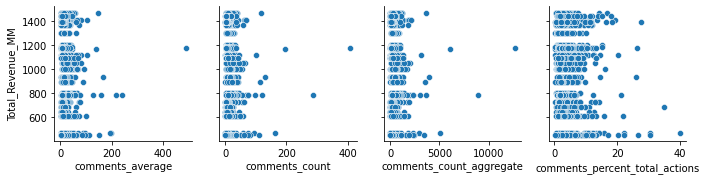

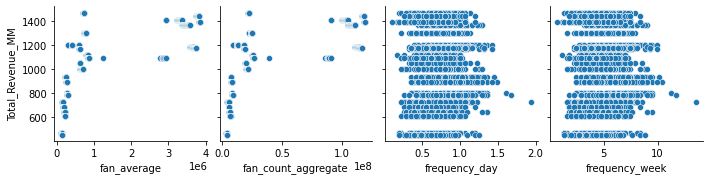

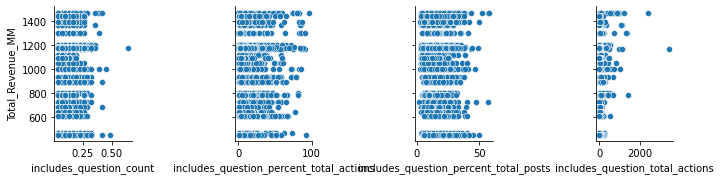

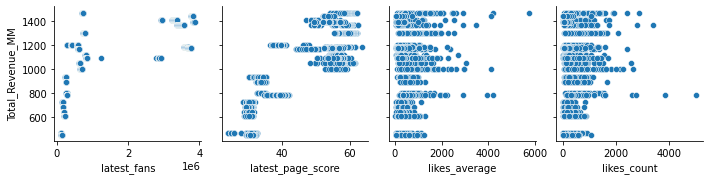

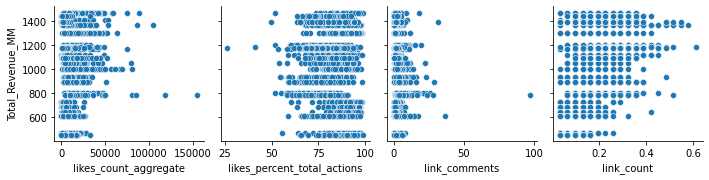

...

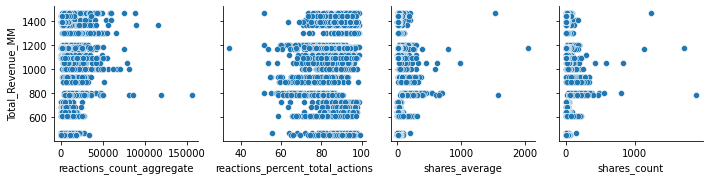

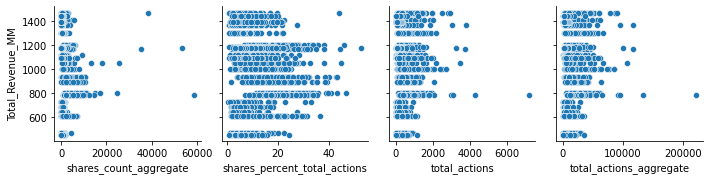

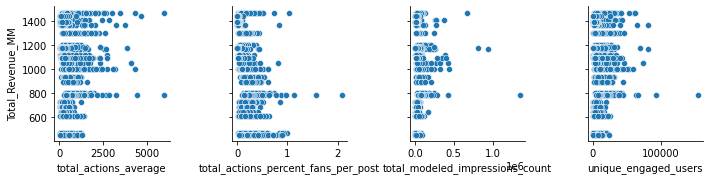

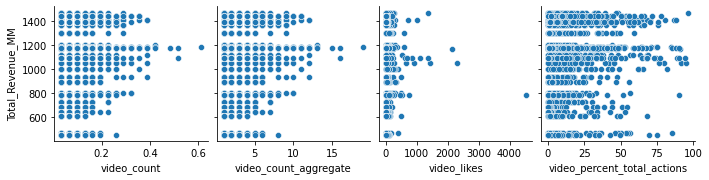

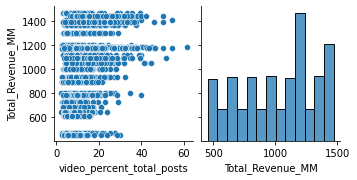

In [ ]:
for i in range(0,len(df_fb1.columns),4):
    sns.pairplot(df_fb1,y_vars=['Total_Revenue_MM'],x_vars = df_fb1.columns[i:i+4])

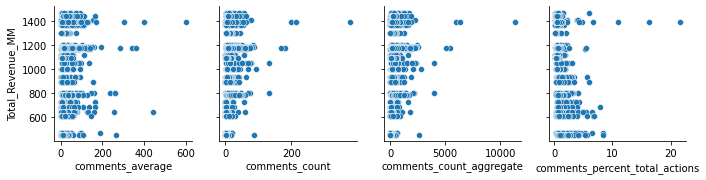

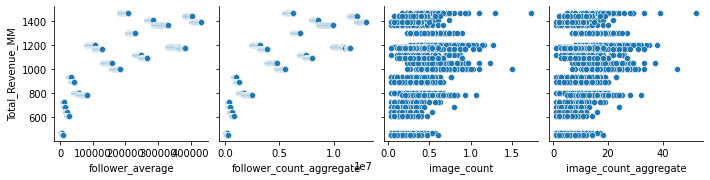

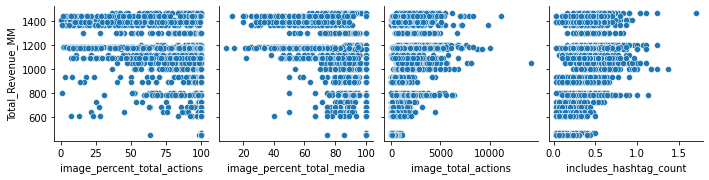

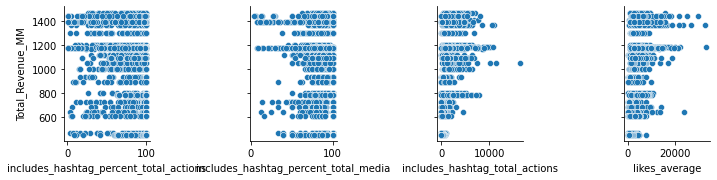

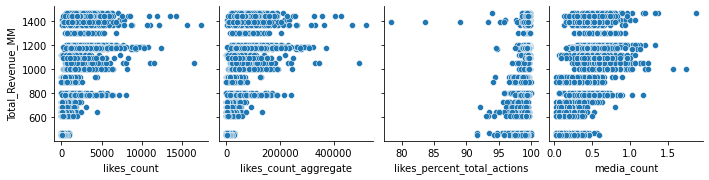

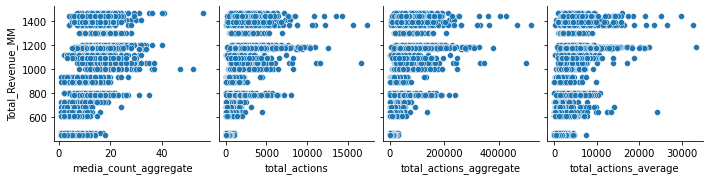

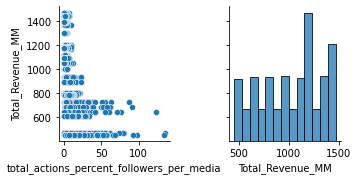

In [ ]:
for i in range(0,len(df_ig1.columns),4):
    sns.pairplot(df_ig1,y_vars=['Total_Revenue_MM'],x_vars = df_ig1.columns[i:i+4])

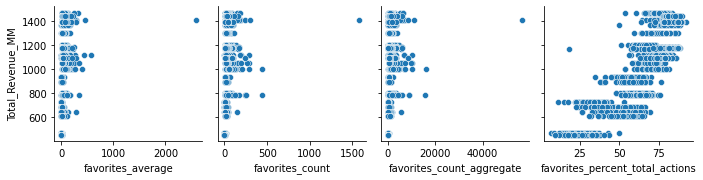

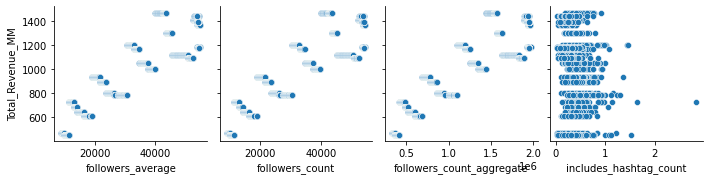

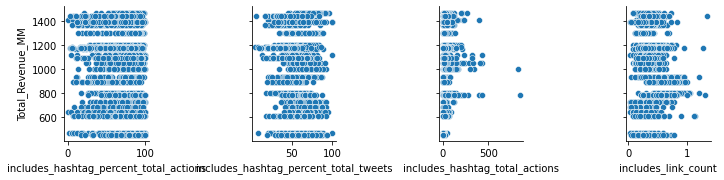

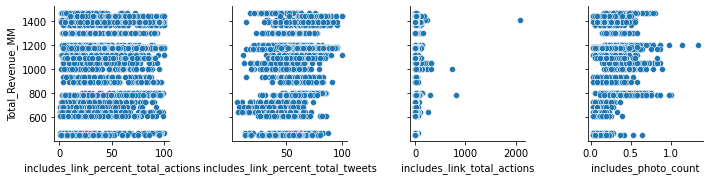

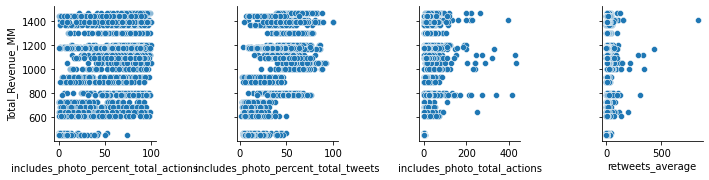

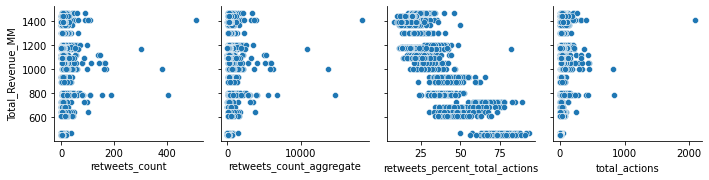

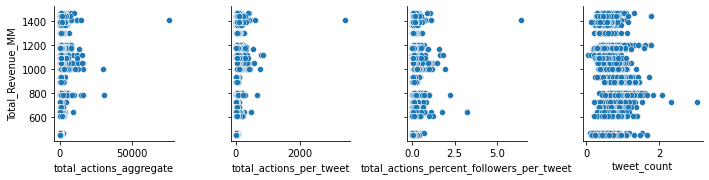

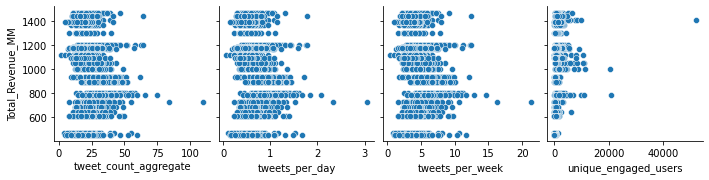

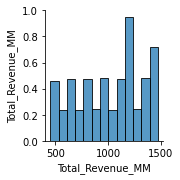

In [ ]:
for i in range(0,len(df_twt1.columns),4):
    sns.pairplot(df_twt1,y_vars=['Total_Revenue_MM'],x_vars = df_twt1.columns[i:i+4])

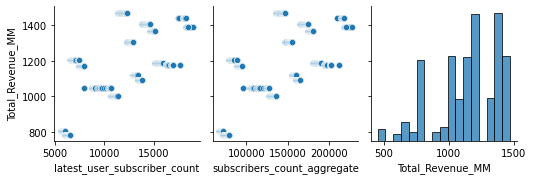

In [ ]:
for i in range(0,len(df_yt1.columns),4):
    sns.pairplot(df_yt1,y_vars=['Total_Revenue_MM'],x_vars = df_yt1.columns[i:i+4])

In [ ]:
df_fb1

In [ ]:
df_fb1.corr()['Total_Revenue_MM']

Plotting the results to better understand the **results**

[Text(0.5, 0, 'comments_average'),
 Text(1.5, 0, 'comments_count'),
 Text(2.5, 0, 'comments_count_aggregate'),
 Text(3.5, 0, 'comments_percent_total_actions'),
 Text(4.5, 0, 'fan_average'),
 Text(5.5, 0, 'fan_count_aggregate'),
 Text(6.5, 0, 'frequency_day'),
 Text(7.5, 0, 'frequency_week'),
 Text(8.5, 0, 'includes_question_count'),
 Text(9.5, 0, 'includes_question_percent_total_actions'),
 Text(10.5, 0, 'includes_question_percent_total_posts'),
 Text(11.5, 0, 'includes_question_total_actions'),
 Text(12.5, 0, 'latest_fans'),
 Text(13.5, 0, 'latest_page_score'),
 Text(14.5, 0, 'likes_average'),
 Text(15.5, 0, 'likes_count'),
 Text(16.5, 0, 'likes_count_aggregate'),
 Text(17.5, 0, 'likes_percent_total_actions'),
 Text(18.5, 0, 'link_comments'),
 Text(19.5, 0, 'link_count'),
 Text(20.5, 0, 'link_count_aggregate'),
 Text(21.5, 0, 'link_likes'),
 Text(22.5, 0, 'link_percent_total_actions'),
 Text(23.5, 0, 'link_percent_total_posts'),
 Text(24.5, 0, 'link_shares'),
 Text(25.5, 0, 'photo_com

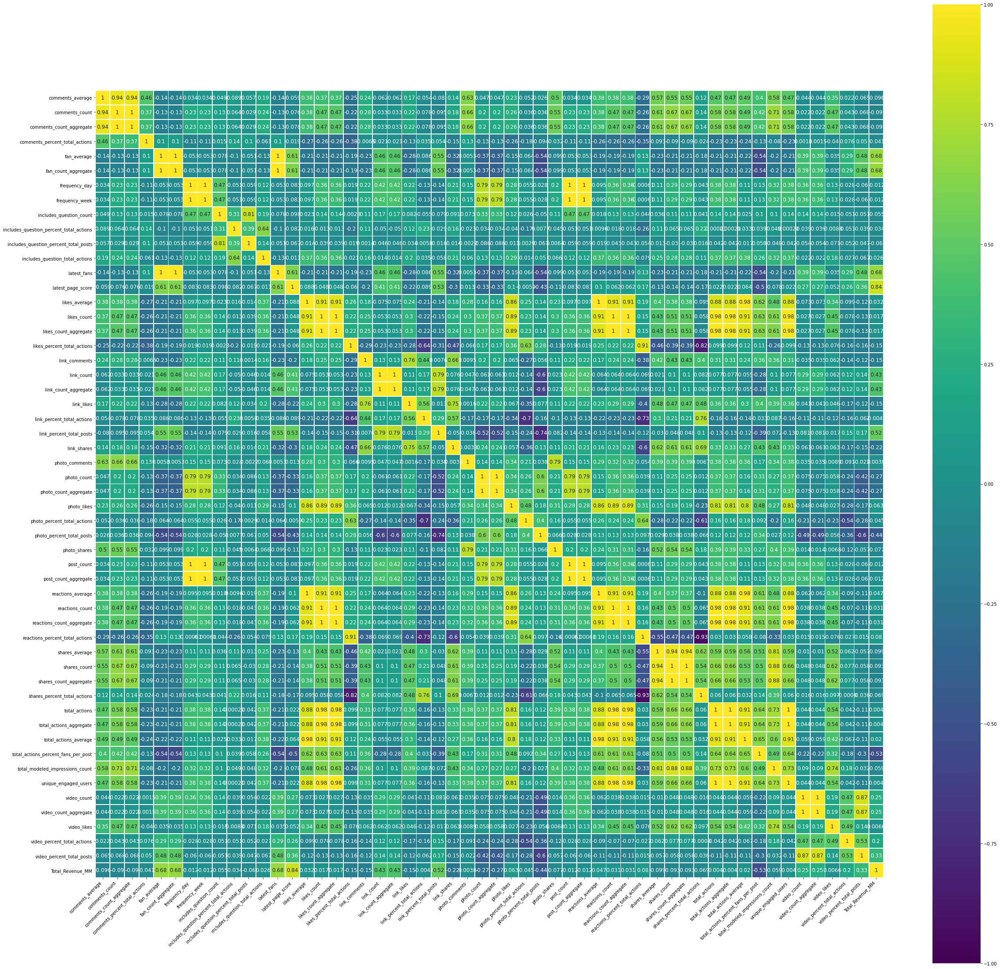

In [ ]:
f_fb, ax_fb = plt.subplots(figsize=(40, 40))
ax_fb = sns.heatmap(
    df_fb1.corr(), 
    vmin=-1, vmax=1,linewidths=0.8,center=0,cmap = 'viridis',
    annot = True, annot_kws={"size":12},
    square=True
)
ax_fb.set_xticklabels(
    ax_fb.get_xticklabels(),
    rotation=45,
    horizontalalignment='right')

In [ ]:
df_ig1.corr()['Total_Revenue_MM']

comments_average                             0.073463
comments_count                               0.229699
comments_count_aggregate                     0.229699
comments_percent_total_actions              -0.344952
follower_average                             0.826470
follower_count_aggregate                     0.826470
image_count                                  0.276432
image_count_aggregate                        0.276432
image_percent_total_actions                 -0.485836
image_percent_total_media                   -0.608093
image_total_actions                          0.359472
includes_hashtag_count                       0.435352
includes_hashtag_percent_total_actions      -0.185861
includes_hashtag_percent_total_media        -0.175460
includes_hashtag_total_actions               0.406617
likes_average                                0.420656
likes_count                                  0.483076
likes_count_aggregate                        0.483076
likes_percent_total_actions 

[Text(0.5, 0, 'comments_average'),
 Text(1.5, 0, 'comments_count'),
 Text(2.5, 0, 'comments_count_aggregate'),
 Text(3.5, 0, 'comments_percent_total_actions'),
 Text(4.5, 0, 'follower_average'),
 Text(5.5, 0, 'follower_count_aggregate'),
 Text(6.5, 0, 'image_count'),
 Text(7.5, 0, 'image_count_aggregate'),
 Text(8.5, 0, 'image_percent_total_actions'),
 Text(9.5, 0, 'image_percent_total_media'),
 Text(10.5, 0, 'image_total_actions'),
 Text(11.5, 0, 'includes_hashtag_count'),
 Text(12.5, 0, 'includes_hashtag_percent_total_actions'),
 Text(13.5, 0, 'includes_hashtag_percent_total_media'),
 Text(14.5, 0, 'includes_hashtag_total_actions'),
 Text(15.5, 0, 'likes_average'),
 Text(16.5, 0, 'likes_count'),
 Text(17.5, 0, 'likes_count_aggregate'),
 Text(18.5, 0, 'likes_percent_total_actions'),
 Text(19.5, 0, 'media_count'),
 Text(20.5, 0, 'media_count_aggregate'),
 Text(21.5, 0, 'total_actions'),
 Text(22.5, 0, 'total_actions_aggregate'),
 Text(23.5, 0, 'total_actions_average'),
 Text(24.5, 0, '

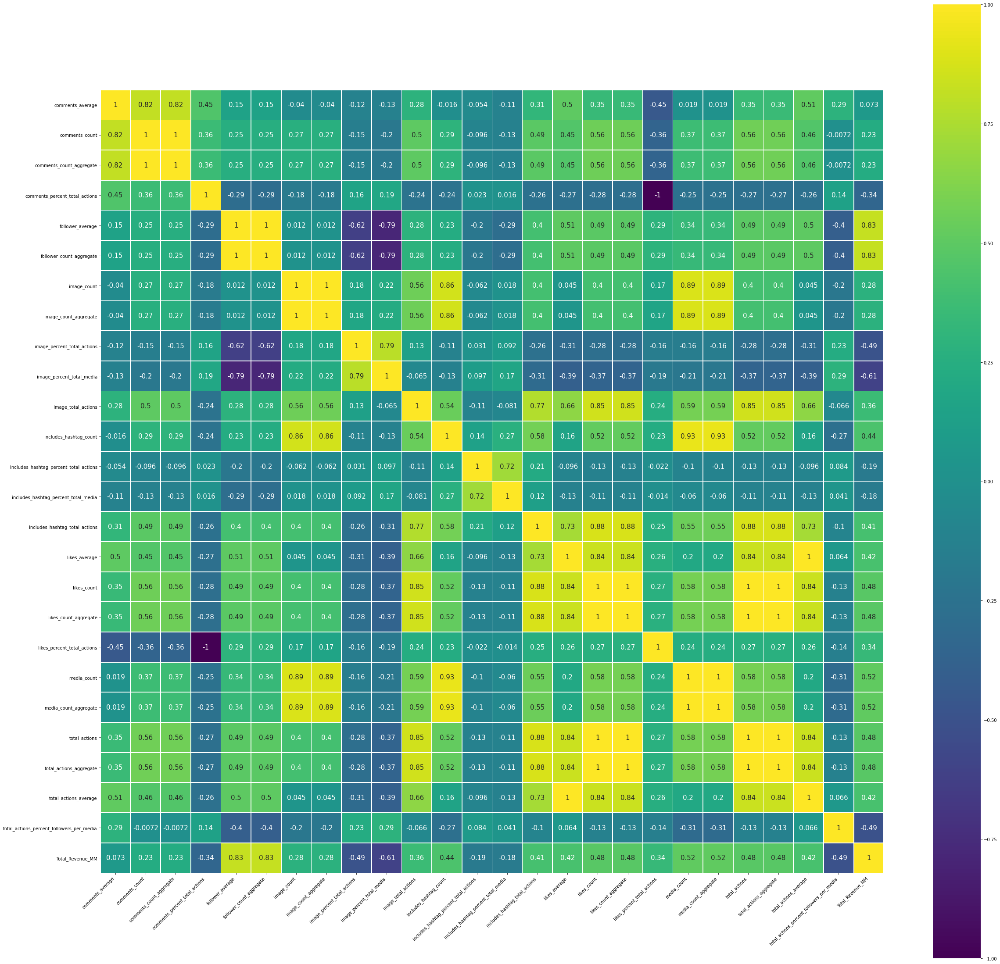

In [ ]:
f_ig, ax_ig = plt.subplots(figsize=(40, 40))
ax_ig = sns.heatmap(
    df_ig1.corr(), 
    vmin=-1, vmax=1,linewidths=0.8,center=0,cmap = 'viridis',
    annot = True, annot_kws={"size":15},
    square=True
)
ax_ig.set_xticklabels(
    ax_ig.get_xticklabels(),
    rotation=45,
    horizontalalignment='right')

In [ ]:
df_yt1.corr()['Total_Revenue_MM']

latest_user_subscriber_count    0.666828
subscribers_count_aggregate     0.666968
Total_Revenue_MM                1.000000
Name: Total_Revenue_MM, dtype: float64

[Text(0.5, 0, 'latest_user_subscriber_count'),
 Text(1.5, 0, 'subscribers_count_aggregate'),
 Text(2.5, 0, 'Total_Revenue_MM')]

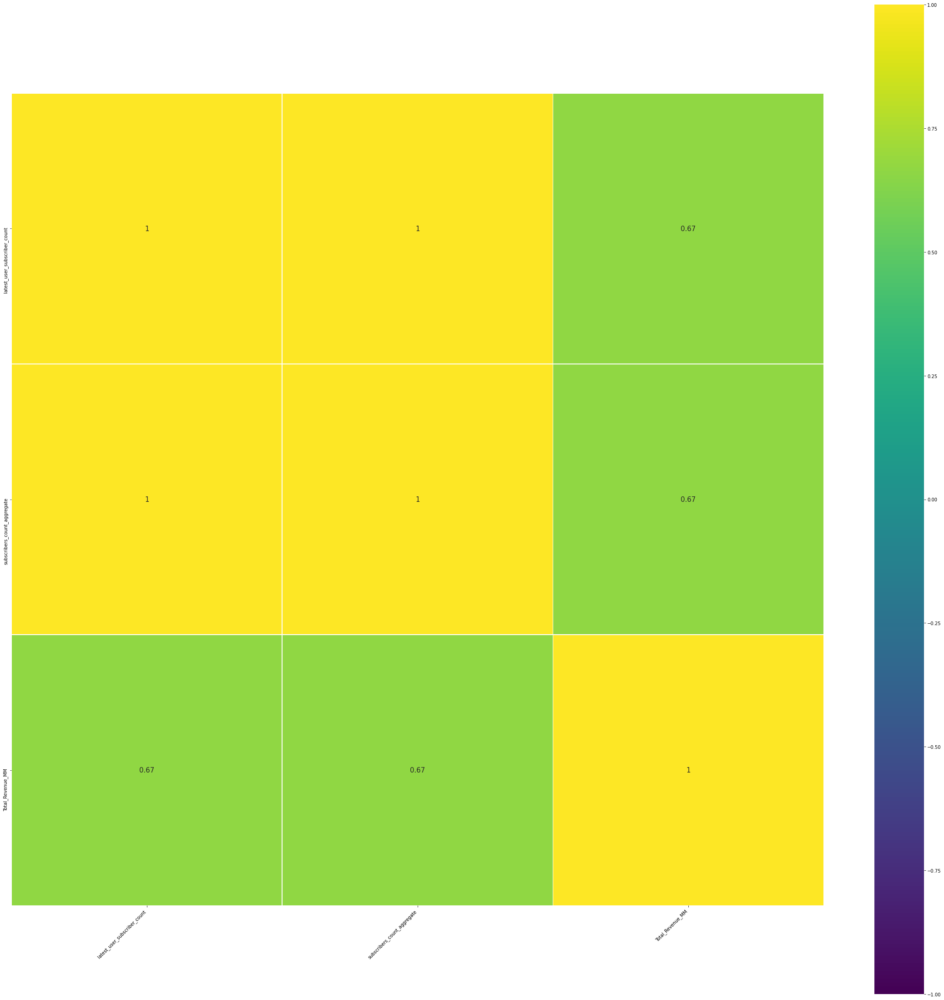

In [ ]:
f_yt, ax_yt = plt.subplots(figsize=(40, 40))
ax_yt = sns.heatmap(
    df_yt1.corr(), 
    vmin=-1, vmax=1,linewidths=0.8,center=0,cmap = 'viridis',
    annot = True, annot_kws={"size":15},
    square=True
)
ax_yt.set_xticklabels(
    ax_yt.get_xticklabels(),
    rotation=45,
    horizontalalignment='right')

In [ ]:
df_twt1.corr()['Total_Revenue_MM']

favorites_average                            0.251768
favorites_count                              0.204520
favorites_count_aggregate                    0.204520
favorites_percent_total_actions              0.841351
followers_average                            0.891036
followers_count                              0.891036
followers_count_aggregate                    0.891062
includes_hashtag_count                      -0.181665
includes_hashtag_percent_total_actions      -0.039821
includes_hashtag_percent_total_tweets       -0.111764
includes_hashtag_total_actions               0.123708
includes_link_count                          0.009461
includes_link_percent_total_actions          0.105354
includes_link_percent_total_tweets           0.285406
includes_link_total_actions                  0.072344
includes_photo_count                         0.284774
includes_photo_percent_total_actions         0.403341
includes_photo_percent_total_tweets          0.525419
includes_photo_total_actions

[Text(0.5, 0, 'favorites_average'),
 Text(1.5, 0, 'favorites_count'),
 Text(2.5, 0, 'favorites_count_aggregate'),
 Text(3.5, 0, 'favorites_percent_total_actions'),
 Text(4.5, 0, 'followers_average'),
 Text(5.5, 0, 'followers_count'),
 Text(6.5, 0, 'followers_count_aggregate'),
 Text(7.5, 0, 'includes_hashtag_count'),
 Text(8.5, 0, 'includes_hashtag_percent_total_actions'),
 Text(9.5, 0, 'includes_hashtag_percent_total_tweets'),
 Text(10.5, 0, 'includes_hashtag_total_actions'),
 Text(11.5, 0, 'includes_link_count'),
 Text(12.5, 0, 'includes_link_percent_total_actions'),
 Text(13.5, 0, 'includes_link_percent_total_tweets'),
 Text(14.5, 0, 'includes_link_total_actions'),
 Text(15.5, 0, 'includes_photo_count'),
 Text(16.5, 0, 'includes_photo_percent_total_actions'),
 Text(17.5, 0, 'includes_photo_percent_total_tweets'),
 Text(18.5, 0, 'includes_photo_total_actions'),
 Text(19.5, 0, 'retweets_average'),
 Text(20.5, 0, 'retweets_count'),
 Text(21.5, 0, 'retweets_count_aggregate'),
 Text(22.5

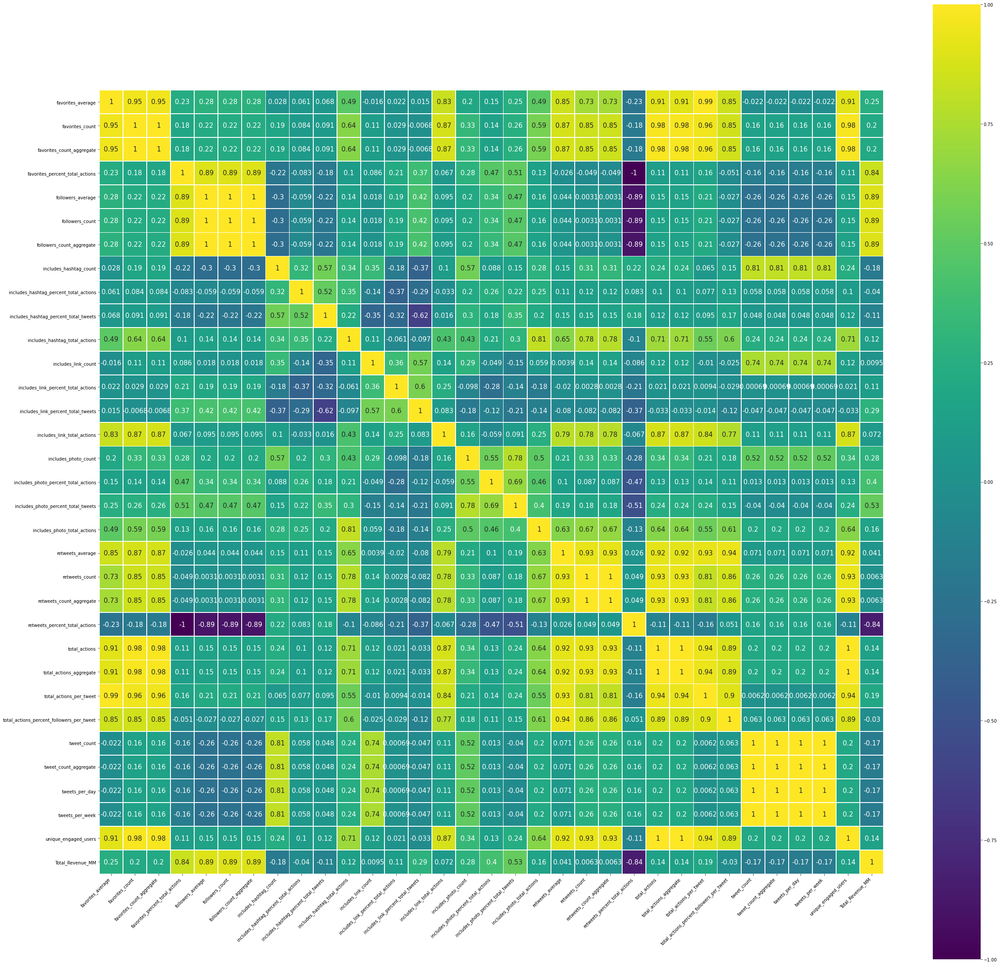

In [ ]:
f_twt, ax_twt = plt.subplots(figsize=(40, 40))
ax_twt = sns.heatmap(
    df_twt1.corr(), 
    vmin=-1, vmax=1,linewidths=0.8,center=0,cmap = 'viridis',
    annot = True, annot_kws={"size":15},
    square=True
)
ax_twt.set_xticklabels(
    ax_twt.get_xticklabels(),
    rotation=45,
    horizontalalignment='right')

Checking which attributes Of Facebook are correlated 

In [ ]:
cor_mat_fb = pd.DataFrame(df_fb1.corr()['Total_Revenue_MM'])
cor_mat_fb['Columns'] = cor_mat_fb.index 
cor_mat_fb.reset_index(inplace=True, drop=True)

cor_mat_fb['Correlated?'] = np.nan
cor_mat_fb.loc[(cor_mat_fb['Total_Revenue_MM']>=0.4)|(cor_mat_fb['Total_Revenue_MM']<=-0.4), 'Correlated?']='Yes'
cor_mat_fb.fillna('No', inplace=True)
cor_mat_fb

,Total_Revenue_MM,Columns,Correlated?
0,-0.095722,comments_average,No
1,-0.090096,comments_count,No
2,-0.090096,comments_count_aggregate,No
3,-0.041424,comments_percent_total_actions,No
4,0.682879,fan_average,Yes
5,0.682879,fan_count_aggregate,Yes
6,-0.012351,frequency_day,No
7,-0.012351,frequency_week,No
8,-0.054607,includes_question_count,No
9,-0.034394,includes_question_percent_total_actions,No


Checking which attributes Of Instagram are correlated

In [ ]:
cor_mat_ig = pd.DataFrame(df_ig1.corr()['Total_Revenue_MM'])
cor_mat_ig['Columns'] = cor_mat_ig.index 
cor_mat_ig.reset_index(inplace=True, drop=True)

cor_mat_ig['Correlated?'] = np.nan
cor_mat_ig.loc[(cor_mat_ig['Total_Revenue_MM']>=0.4)|(cor_mat_ig['Total_Revenue_MM']<=-0.4), 'Correlated?']='Yes'
cor_mat_ig.fillna('No', inplace=True)
cor_mat_ig

,Total_Revenue_MM,Columns,Correlated?
0,0.073463,comments_average,No
1,0.229699,comments_count,No
2,0.229699,comments_count_aggregate,No
3,-0.344952,comments_percent_total_actions,No
4,0.826470,follower_average,Yes
5,0.826470,follower_count_aggregate,Yes
6,0.276432,image_count,No
7,0.276432,image_count_aggregate,No
8,-0.485836,image_percent_total_actions,Yes
9,-0.608093,image_percent_total_media,Yes


Checking which attributes Of YouTube are correlated

In [ ]:
cor_mat_yt = pd.DataFrame(df_yt1.corr()['Total_Revenue_MM'])
cor_mat_yt['Columns'] = cor_mat_yt.index 
cor_mat_yt.reset_index(inplace=True, drop=True)

cor_mat_yt['Correlated?'] = np.nan
cor_mat_yt.loc[(cor_mat_yt['Total_Revenue_MM']>=0.4)|(cor_mat_yt['Total_Revenue_MM']<=-0.4), 'Correlated?']='Yes'
cor_mat_yt.fillna('No', inplace=True)
cor_mat_yt

,Total_Revenue_MM,Columns,Correlated?
0,0.666828,latest_user_subscriber_count,Yes
1,0.666968,subscribers_count_aggregate,Yes
2,1.000000,Total_Revenue_MM,Yes


Checking which attributes Of Twitter are correlated

In [ ]:
cor_mat_twt = pd.DataFrame(df_twt1.corr()['Total_Revenue_MM'])
cor_mat_twt['Columns'] = cor_mat_twt.index 
cor_mat_twt.reset_index(inplace=True, drop=True)

cor_mat_twt['Correlated?'] = np.nan
cor_mat_twt.loc[(cor_mat_twt['Total_Revenue_MM']>=0.4)|(cor_mat_twt['Total_Revenue_MM']<=-0.4), 'Correlated?']='Yes'
cor_mat_twt.fillna('No', inplace=True)
cor_mat_twt

,Total_Revenue_MM,Columns,Correlated?
0,0.251768,favorites_average,No
1,0.204520,favorites_count,No
2,0.204520,favorites_count_aggregate,No
3,0.841351,favorites_percent_total_actions,Yes
4,0.891036,followers_average,Yes
5,0.891036,followers_count,Yes
6,0.891062,followers_count_aggregate,Yes
7,-0.181665,includes_hashtag_count,No
8,-0.039821,includes_hashtag_percent_total_actions,No
9,-0.111764,includes_hashtag_percent_total_tweets,No


Performing Spearman Correlation test for signifance measure based on P-val

In [ ]:
def spearman_test(df):
    rho_llist = []
    pval_list= []
    for i in range(df.shape[1]):
        t = stats.spearmanr(df.iloc[:,i],df['Total_Revenue_MM'])
        rho_llist.append(t[0])
        pval_list.append(t[1])
    return rho_llist, pval_list

In [ ]:
spearman_test_list_fb = spearman_test(df_fb1)[1]
spearman_test_list_ig = spearman_test(df_ig1)[1]
spearman_test_list_yt = spearman_test(df_yt1)[1]
spearman_test_list_twt = spearman_test(df_twt1)[1]

Filling the NA values

In [ ]:
spearman_df_fb = pd.DataFrame({'Columns':df_fb1.columns,'Pval':spearman_test_list_fb})
spearman_df_fb['Significance'] = np.nan
spearman_df_fb.loc[spearman_df_fb['Pval'] <= 0.05, 'Significance'] = 'Yes'
spearman_df_fb['Significance'].fillna('No', inplace = True)

spearman_df_ig = pd.DataFrame({'Columns':df_ig1.columns,'Pval':spearman_test_list_ig})
spearman_df_ig['Significance'] = np.nan
spearman_df_ig.loc[spearman_df_ig['Pval'] <= 0.05, 'Significance'] = 'Yes'
spearman_df_ig['Significance'].fillna('No', inplace = True)

spearman_df_yt = pd.DataFrame({'Columns':df_yt1.columns,'Pval':spearman_test_list_yt})
spearman_df_yt['Significance'] = np.nan
spearman_df_yt.loc[spearman_df_yt['Pval'] <= 0.05, 'Significance'] = 'Yes'
spearman_df_yt['Significance'].fillna('No', inplace = True)

spearman_df_twt = pd.DataFrame({'Columns':df_twt1.columns,'Pval':spearman_test_list_twt})
spearman_df_twt['Significance'] = np.nan
spearman_df_twt.loc[spearman_df_twt['Pval'] <= 0.05, 'Significance'] = 'Yes'
spearman_df_twt['Significance'].fillna('No', inplace = True)

In [ ]:
spearman_df_fb

,Columns,Pval,Significance
0,comments_average,2.321399e-08,Yes
1,comments_count,3.469455e-08,Yes
2,comments_count_aggregate,3.469455e-08,Yes
3,comments_percent_total_actions,1.472864e-01,No
4,fan_average,0.000000e+00,Yes
5,fan_count_aggregate,0.000000e+00,Yes
6,frequency_day,6.107424e-01,No
7,frequency_week,6.107424e-01,No
8,includes_question_count,NaN,No
9,includes_question_percent_total_actions,NaN,No


In [ ]:
spearman_df_ig

,Columns,Pval,Significance
0,comments_average,NaN,No
1,comments_count,NaN,No
2,comments_count_aggregate,NaN,No
3,comments_percent_total_actions,NaN,No
4,follower_average,0.0,Yes
5,follower_count_aggregate,0.0,Yes
6,image_count,NaN,No
7,image_count_aggregate,NaN,No
8,image_percent_total_actions,NaN,No
9,image_percent_total_media,NaN,No


In [ ]:
spearman_df_yt

,Columns,Pval,Significance
0,latest_user_subscriber_count,NaN,No
1,subscribers_count_aggregate,NaN,No
2,Total_Revenue_MM,0.0,Yes


In [ ]:
spearman_df_twt

,Columns,Pval,Significance
0,favorites_average,1.139167e-215,Yes
1,favorites_count,4.196368e-143,Yes
2,favorites_count_aggregate,4.196368e-143,Yes
3,favorites_percent_total_actions,0.000000e+00,Yes
4,followers_average,0.000000e+00,Yes
5,followers_count,0.000000e+00,Yes
6,followers_count_aggregate,0.000000e+00,Yes
7,includes_hashtag_count,1.602712e-22,Yes
8,includes_hashtag_percent_total_actions,NaN,No
9,includes_hashtag_percent_total_tweets,9.275405e-08,Yes


All of the above dataframes have Total Revenue as one of the rows, we will pop it to understand the correlation the attributes w.r.t Total Revenue

In [ ]:
cor_list_fb = cor_mat_fb.loc[cor_mat_fb['Correlated?']=='Yes', 'Columns'].to_list()
cor_list_fb.pop(-1)
cor_list_fb

['fan_average',
 'fan_count_aggregate',
 'latest_fans',
 'latest_page_score',
 'link_count',
 'link_count_aggregate',
 'link_percent_total_posts',
 'photo_percent_total_posts',
 'total_actions_percent_fans_per_post']

In [ ]:
cor_list_ig = cor_mat_ig.loc[cor_mat_ig['Correlated?']=='Yes', 'Columns'].to_list()
cor_list_ig.pop(-1)
cor_list_ig

['follower_average',
 'follower_count_aggregate',
 'image_percent_total_actions',
 'image_percent_total_media',
 'includes_hashtag_count',
 'includes_hashtag_total_actions',
 'likes_average',
 'likes_count',
 'likes_count_aggregate',
 'media_count',
 'media_count_aggregate',
 'total_actions',
 'total_actions_aggregate',
 'total_actions_average',
 'total_actions_percent_followers_per_media']

In [ ]:
cor_list_yt = cor_mat_yt.loc[cor_mat_yt['Correlated?']=='Yes', 'Columns'].to_list()
cor_list_yt.pop(-1)
cor_list_yt

['latest_user_subscriber_count', 'subscribers_count_aggregate']

In [ ]:
cor_list_twt = cor_mat_twt.loc[cor_mat_twt['Correlated?']=='Yes', 'Columns'].to_list()
cor_list_twt.pop(-1)
cor_list_twt

['favorites_percent_total_actions',
 'followers_average',
 'followers_count',
 'followers_count_aggregate',
 'includes_photo_percent_total_actions',
 'includes_photo_percent_total_tweets',
 'retweets_percent_total_actions']

In [ ]:
df_fb1.shape

(2181, 54)

We saw some Null values. Let us remove them for Instagram and Twitter as well. Youtube does not have any significant attributes left, hence we won't be working Youtube's dataframe

In [ ]:
df_fb1[cor_list_fb].isna().sum()
df_fb1.dropna(inplace=True)
n_fb = df_fb1[cor_list_fb]

df_ig1[cor_list_ig].isna().sum()
df_ig1.dropna(inplace=True)
n_ig = df_ig1[cor_list_ig]

df_yt1[cor_list_yt].isna().sum()
df_yt1.dropna(inplace=True)
n_yt = df_yt1[cor_list_yt]

df_twt1[cor_list_twt].isna().sum()
df_twt1.dropna(inplace=True)
n_twt = df_twt1[cor_list_twt]

In [ ]:
df_fb1

In [ ]:
df_fb1.shape

(1587, 54)

In [ ]:
n_fb

,fan_average,fan_count_aggregate,latest_fans,latest_page_score,link_count,link_count_aggregate,link_percent_total_posts,photo_percent_total_posts,total_actions_percent_fans_per_post
date,,,,,,,,,
2013-01-02,1.256111e+05,3893943.0,1.256111e+05,26.000000,0.129032,4.0,21.052632,52.631579,0.985247
2013-01-07,1.261231e+05,3909816.0,1.261231e+05,26.000000,0.161290,5.0,18.518519,59.259259,0.344637
2013-01-09,1.263453e+05,3916704.0,1.263453e+05,24.322581,0.096774,3.0,12.000000,64.000000,0.934360
2013-01-15,1.269522e+05,3935519.0,1.269522e+05,26.000000,0.096774,3.0,10.344828,55.172414,0.443012
2013-01-16,1.270666e+05,3939066.0,1.270666e+05,26.000000,0.064516,2.0,9.523810,71.428571,0.490331
2013-01-17,1.271343e+05,3941163.0,1.271343e+05,28.129032,0.064516,2.0,7.142857,60.714286,0.468346
2013-01-21,1.274026e+05,3949482.0,1.274026e+05,29.516129,0.064516,2.0,6.896552,58.620690,0.607333
2013-01-23,1.278232e+05,3962520.0,1.278232e+05,27.935484,0.129032,4.0,14.814815,66.666667,0.211403
2013-01-24,1.279286e+05,3965787.0,1.279286e+05,31.322581,0.064516,2.0,7.692308,69.230769,0.194820


In [ ]:
m1 = pd.merge(n_fb, n_ig, how='inner', left_index=True, right_index=True)
m2 = pd.merge(m1, n_yt, how='inner', left_index=True, right_index=True)
m3 = pd.merge(m2, n_twt, how='inner', left_index=True, right_index=True)

In [ ]:
m1.shape

(1559, 24)

In [ ]:
m3.columns

Index(['fan_average', 'fan_count_aggregate', 'latest_fans',
       'latest_page_score', 'link_count', 'link_count_aggregate',
       'link_percent_total_posts', 'photo_percent_total_posts',
       'total_actions_percent_fans_per_post', 'follower_average',
       'follower_count_aggregate', 'image_percent_total_actions',
       'image_percent_total_media', 'includes_hashtag_count',
       'includes_hashtag_total_actions', 'likes_average', 'likes_count',
       'likes_count_aggregate', 'media_count', 'media_count_aggregate',
       'total_actions', 'total_actions_aggregate', 'total_actions_average',
       'total_actions_percent_followers_per_media',
       'latest_user_subscriber_count', 'subscribers_count_aggregate',
       'favorites_percent_total_actions', 'followers_average',
       'followers_count', 'followers_count_aggregate',
       'includes_photo_percent_total_actions',
       'includes_photo_percent_total_tweets',
       'retweets_percent_total_actions'],
      dtype='object'

In [ ]:
n_twt.shape

(2081, 7)

In [ ]:
m3['date']=m3.index
m3

,fan_average,fan_count_aggregate,latest_fans,latest_page_score,link_count,link_count_aggregate,link_percent_total_posts,photo_percent_total_posts,total_actions_percent_fans_per_post,follower_average,follower_count_aggregate,image_percent_total_actions,image_percent_total_media,includes_hashtag_count,includes_hashtag_total_actions,likes_average,likes_count,likes_count_aggregate,media_count,media_count_aggregate,total_actions,total_actions_aggregate,total_actions_average,total_actions_percent_followers_per_media,latest_user_subscriber_count,subscribers_count_aggregate,favorites_percent_total_actions,followers_average,followers_count,followers_count_aggregate,includes_photo_percent_total_actions,includes_photo_percent_total_tweets,retweets_percent_total_actions,date
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-01-12,2.739588e+05,8492723.0,2.739588e+05,33.903226,0.322581,10.0,35.714286,53.571429,0.283538,44396.333333,1331890.0,50.949872,85.714286,0.200000,617.200000,3515.285714,820.233333,24607.0,0.233333,7.0,835.200000,25056.0,3579.428571,8.062442,5615.000000,67380.0,60.475483,24145.555556,24145.555556,869240.0,28.677563,13.953488,39.524517,2015-01-12
2015-01-13,2.734729e+05,8477660.0,2.734729e+05,33.903226,0.354839,11.0,39.285714,50.000000,0.330694,44548.133333,1336444.0,69.981290,83.333333,0.400000,1585.566667,3927.000000,1570.800000,47124.0,0.400000,12.0,1585.566667,47567.0,3963.916667,8.898053,5615.333333,67384.0,64.900000,24171.416667,24171.416667,870171.0,69.300000,45.238095,35.100000,2015-01-13
2015-01-14,2.743037e+05,8503416.0,2.743037e+05,34.774194,0.290323,9.0,24.324324,59.459459,0.518906,44708.766667,1341263.0,98.844946,90.909091,0.333333,1668.733333,4538.181818,1664.000000,49920.0,0.366667,11.0,1688.233333,50647.0,4604.272727,10.298367,5618.833333,67426.0,64.925373,24195.194444,24195.194444,871027.0,66.169154,46.428571,35.074627,2015-01-14
2015-01-15,2.744459e+05,8507823.0,2.744459e+05,34.774194,0.225806,7.0,24.137931,34.482759,0.251089,44884.266667,1346528.0,63.333257,88.888889,0.300000,1461.633333,4806.888889,1442.066667,43262.0,0.300000,9.0,1461.633333,43849.0,4872.111111,10.854831,5623.500000,67482.0,65.023474,24224.083333,24224.083333,872067.0,79.460094,33.333333,34.976526,2015-01-15
2015-01-16,2.745876e+05,8512217.0,2.745876e+05,34.741935,0.193548,6.0,18.750000,56.250000,0.154960,45028.733333,1350862.0,100.000000,100.000000,0.400000,346.366667,1358.846154,588.833333,17665.0,0.433333,13.0,595.866667,17876.0,1375.076923,3.053777,5629.083333,67549.0,47.649824,24249.083333,24249.083333,872967.0,69.917744,32.653061,52.350176,2015-01-16
2015-01-17,2.746923e+05,8515462.0,2.746923e+05,34.774194,0.161290,5.0,31.250000,50.000000,0.355238,45162.566667,1354877.0,53.211287,75.000000,0.133333,881.266667,6524.750000,869.966667,26099.0,0.133333,4.0,881.266667,26438.0,6609.500000,14.634908,5632.833333,67594.0,68.191489,24270.027778,24270.027778,873721.0,48.723404,18.518519,31.808511,2015-01-17
2015-01-19,2.749264e+05,8522719.0,2.749264e+05,34.516129,0.193548,6.0,14.285714,66.666667,0.531926,45522.500000,1365675.0,52.166952,84.615385,0.366667,1202.433333,2772.384615,1201.366667,36041.0,0.433333,13.0,1207.533333,36226.0,2786.615385,6.121402,5642.500000,67710.0,53.092182,24321.777778,24321.777778,875584.0,44.457410,34.090909,46.907818,2015-01-19
2015-01-21,2.751888e+05,8530852.0,2.751888e+05,34.580645,0.258065,8.0,28.571429,57.142857,0.269399,45825.566667,1374767.0,100.000000,100.000000,0.333333,624.666667,1854.500000,618.166667,18545.0,0.333333,10.0,624.666667,18740.0,1874.000000,4.089420,5651.083333,67813.0,67.058824,24381.361111,24381.361111,877729.0,60.000000,34.000000,32.941176,2015-01-21
2015-01-23,2.738050e+05,8487954.0,2.738050e+05,32.967742,0.322581,10.0,27.777778,50.000000,0.215685,46182.700000,1385481.0,66.818801,88.888889,0.266667,1265.266667,4366.222222,1309.866667,39296.0,0.300000,9.0,1321.933333,39658.0,4406.444444,9.541331,5658.500000,67902.0,64.106710,24443.444444,24443.444444,879964.0,77.243331,35.416667,35.893290,

In [ ]:
m3.shape

(1145, 34)

In [ ]:
m3["Quarter"] = m3['date'].apply(lambda x: get_quart(x))
m3

,fan_average,fan_count_aggregate,latest_fans,latest_page_score,link_count,link_count_aggregate,link_percent_total_posts,photo_percent_total_posts,total_actions_percent_fans_per_post,follower_average,follower_count_aggregate,image_percent_total_actions,image_percent_total_media,includes_hashtag_count,includes_hashtag_total_actions,likes_average,likes_count,likes_count_aggregate,media_count,media_count_aggregate,total_actions,total_actions_aggregate,total_actions_average,total_actions_percent_followers_per_media,latest_user_subscriber_count,subscribers_count_aggregate,favorites_percent_total_actions,followers_average,followers_count,followers_count_aggregate,includes_photo_percent_total_actions,includes_photo_percent_total_tweets,retweets_percent_total_actions,date,Quarter
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-01-12,2.739588e+05,8492723.0,2.739588e+05,33.903226,0.322581,10.0,35.714286,53.571429,0.283538,44396.333333,1331890.0,50.949872,85.714286,0.200000,617.200000,3515.285714,820.233333,24607.0,0.233333,7.0,835.200000,25056.0,3579.428571,8.062442,5615.000000,67380.0,60.475483,24145.555556,24145.555556,869240.0,28.677563,13.953488,39.524517,2015-01-12,Q1\nMar-31-2015
2015-01-13,2.734729e+05,8477660.0,2.734729e+05,33.903226,0.354839,11.0,39.285714,50.000000,0.330694,44548.133333,1336444.0,69.981290,83.333333,0.400000,1585.566667,3927.000000,1570.800000,47124.0,0.400000,12.0,1585.566667,47567.0,3963.916667,8.898053,5615.333333,67384.0,64.900000,24171.416667,24171.416667,870171.0,69.300000,45.238095,35.100000,2015-01-13,Q1\nMar-31-2015
2015-01-14,2.743037e+05,8503416.0,2.743037e+05,34.774194,0.290323,9.0,24.324324,59.459459,0.518906,44708.766667,1341263.0,98.844946,90.909091,0.333333,1668.733333,4538.181818,1664.000000,49920.0,0.366667,11.0,1688.233333,50647.0,4604.272727,10.298367,5618.833333,67426.0,64.925373,24195.194444,24195.194444,871027.0,66.169154,46.428571,35.074627,2015-01-14,Q1\nMar-31-2015
2015-01-15,2.744459e+05,8507823.0,2.744459e+05,34.774194,0.225806,7.0,24.137931,34.482759,0.251089,44884.266667,1346528.0,63.333257,88.888889,0.300000,1461.633333,4806.888889,1442.066667,43262.0,0.300000,9.0,1461.633333,43849.0,4872.111111,10.854831,5623.500000,67482.0,65.023474,24224.083333,24224.083333,872067.0,79.460094,33.333333,34.976526,2015-01-15,Q1\nMar-31-2015
2015-01-16,2.745876e+05,8512217.0,2.745876e+05,34.741935,0.193548,6.0,18.750000,56.250000,0.154960,45028.733333,1350862.0,100.000000,100.000000,0.400000,346.366667,1358.846154,588.833333,17665.0,0.433333,13.0,595.866667,17876.0,1375.076923,3.053777,5629.083333,67549.0,47.649824,24249.083333,24249.083333,872967.0,69.917744,32.653061,52.350176,2015-01-16,Q1\nMar-31-2015
2015-01-17,2.746923e+05,8515462.0,2.746923e+05,34.774194,0.161290,5.0,31.250000,50.000000,0.355238,45162.566667,1354877.0,53.211287,75.000000,0.133333,881.266667,6524.750000,869.966667,26099.0,0.133333,4.0,881.266667,26438.0,6609.500000,14.634908,5632.833333,67594.0,68.191489,24270.027778,24270.027778,873721.0,48.723404,18.518519,31.808511,2015-01-17,Q1\nMar-31-2015
2015-01-19,2.749264e+05,8522719.0,2.749264e+05,34.516129,0.193548,6.0,14.285714,66.666667,0.531926,45522.500000,1365675.0,52.166952,84.615385,0.366667,1202.433333,2772.384615,1201.366667,36041.0,0.433333,13.0,1207.533333,36226.0,2786.615385,6.121402,5642.500000,67710.0,53.092182,24321.777778,24321.777778,875584.0,44.457410,34.090909,46.907818,2015-01-19,Q1\nMar-31-2015
2015-01-21,2.751888e+05,8530852.0,2.751888e+05,34.580645,0.258065,8.0,28.571429,57.142857,0.269399,45825.566667,1374767.0,100.000000,100.000000,0.333333,624.666667,1854.500000,618.166667,18545.0,0.333333,10.0,624.666667,18740.0,1874.000000,4.089420,5651.083333,67813.0,67.058824,24381.361111,24381.361111,877729.0,60.000000,34.000000,32.941176,2015-01-21,Q1\nMar-31-2015
2015-01-23,2.738050e+05,8487954.0,2.738050e+05,32.967742,0.322581,10.0,27.777778,50.000000,0.215685,46182.700000,1385481.0,66.818801,88.888889,0.266667,1265.266667,4366.222222,1309.866667,39296.0,0.300000,9.0

In [ ]:
m3.to_excel('Crazy_assignment.xlsx')

In [ ]:
qdict = {'Q1\nMar-31-2015':'1', 'Q2\nJun-30-2015':'2', 'Q3\nSep-30-2015':'3',
       'Q4\nDec-31-2015':'4', 'Q1\nMar-31-2016':'5', 'Q2\nJun-30-2016':'6',
       'Q3\nSep-30-2016': '7', 'Q4\nDec-31-2016': '8', 'Q1\nMar-31-2017': '9',
       'Q2\nJun-30-2017': '10', 'Q3\nSep-30-2017': '11', 'Q4\nDec-31-2017': '12',
       'Q1\nMar-31-2018': '13', 'Q2\nJun-30-2018': '14', 'Q3\nSep-30-2018': '15',
       'Q4\nDec-31-2018': '16'}

In [ ]:
m3['Q'] = m3['Quarter'].apply(lambda x: qdict[x])

In [ ]:
ua_modeldf = pd.merge(m3, df_sales, how='inner', left_on='Quarter', right_on='Quarter')
ua_modeldf['Total_Revenue_MM'].dtypes
# ua_modeldf['Total_Revenue_MM']= ua_modeldf['Total_Revenue_MM'].str.replace(',','')
# ua_modeldf['Total_Revenue_MM'] = ua_modeldf['Total_Revenue_MM'].astype('float')

dtype('float64')

In [ ]:
features = ['fan_average', 'fan_count_aggregate', 'latest_fans',
       'latest_page_score', 'link_count', 'link_count_aggregate',
       'link_percent_total_posts', 'photo_percent_total_posts',
       'total_actions_percent_fans_per_post', 'follower_average',
       'follower_count_aggregate', 'image_percent_total_actions',
       'image_percent_total_media', 'includes_hashtag_count',
       'includes_hashtag_total_actions', 'likes_average', 'likes_count',
       'likes_count_aggregate', 'media_count', 'media_count_aggregate',
       'total_actions', 'total_actions_aggregate', 'total_actions_average',
       'total_actions_percent_followers_per_media',
       'latest_user_subscriber_count', 'subscribers_count_aggregate',
       'favorites_percent_total_actions', 'followers_average',
       'followers_count', 'followers_count_aggregate',
       'includes_photo_percent_total_actions',
       'includes_photo_percent_total_tweets',
       'retweets_percent_total_actions']

In [ ]:
ua_modeldf

,fan_average,fan_count_aggregate,latest_fans,latest_page_score,link_count,link_count_aggregate,link_percent_total_posts,photo_percent_total_posts,total_actions_percent_fans_per_post,follower_average,follower_count_aggregate,image_percent_total_actions,image_percent_total_media,includes_hashtag_count,includes_hashtag_total_actions,likes_average,likes_count,likes_count_aggregate,media_count,media_count_aggregate,total_actions,total_actions_aggregate,total_actions_average,total_actions_percent_followers_per_media,latest_user_subscriber_count,subscribers_count_aggregate,favorites_percent_total_actions,followers_average,followers_count,followers_count_aggregate,includes_photo_percent_total_actions,includes_photo_percent_total_tweets,retweets_percent_total_actions,date,Quarter,Q,Total_Revenue_MM
0,2.739588e+05,8492723.0,2.739588e+05,33.903226,0.322581,10.0,35.714286,53.571429,0.283538,44396.333333,1331890.0,50.949872,85.714286,0.200000,617.200000,3515.285714,820.233333,24607.0,0.233333,7.0,835.200000,25056.0,3579.428571,8.062442,5615.000000,67380.0,60.475483,24145.555556,24145.555556,869240.0,28.677563,13.953488,39.524517,2015-01-12,Q1\nMar-31-2015,1,804.941
1,2.734729e+05,8477660.0,2.734729e+05,33.903226,0.354839,11.0,39.285714,50.000000,0.330694,44548.133333,1336444.0,69.981290,83.333333,0.400000,1585.566667,3927.000000,1570.800000,47124.0,0.400000,12.0,1585.566667,47567.0,3963.916667,8.898053,5615.333333,67384.0,64.900000,24171.416667,24171.416667,870171.0,69.300000,45.238095,35.100000,2015-01-13,Q1\nMar-31-2015,1,804.941
2,2.743037e+05,8503416.0,2.743037e+05,34.774194,0.290323,9.0,24.324324,59.459459,0.518906,44708.766667,1341263.0,98.844946,90.909091,0.333333,1668.733333,4538.181818,1664.000000,49920.0,0.366667,11.0,1688.233333,50647.0,4604.272727,10.298367,5618.833333,67426.0,64.925373,24195.194444,24195.194444,871027.0,66.169154,46.428571,35.074627,2015-01-14,Q1\nMar-31-2015,1,804.941
3,2.744459e+05,8507823.0,2.744459e+05,34.774194,0.225806,7.0,24.137931,34.482759,0.251089,44884.266667,1346528.0,63.333257,88.888889,0.300000,1461.633333,4806.888889,1442.066667,43262.0,0.300000,9.0,1461.633333,43849.0,4872.111111,10.854831,5623.500000,67482.0,65.023474,24224.083333,24224.083333,872067.0,79.460094,33.333333,34.976526,2015-01-15,Q1\nMar-31-2015,1,804.941
4,2.745876e+05,8512217.0,2.745876e+05,34.741935,0.193548,6.0,18.750000,56.250000,0.154960,45028.733333,1350862.0,100.000000,100.000000,0.400000,346.366667,1358.846154,588.833333,17665.0,0.433333,13.0,595.866667,17876.0,1375.076923,3.053777,5629.083333,67549.0,47.649824,24249.083333,24249.083333,872967.0,69.917744,32.653061,52.350176,2015-01-16,Q1\nMar-31-2015,1,804.941
5,2.746923e+05,8515462.0,2.746923e+05,34.774194,0.161290,5.0,31.250000,50.000000,0.355238,45162.566667,1354877.0,53.211287,75.000000,0.133333,881.266667,6524.750000,869.966667,26099.0,0.133333,4.0,881.266667,26438.0,6609.500000,14.634908,5632.833333,67594.0,68.191489,24270.027778,24270.027778,873721.0,48.723404,18.518519,31.808511,2015-01-17,Q1\nMar-31-2015,1,804.941
6,2.749264e+05,8522719.0,2.749264e+05,34.516129,0.193548,6.0,14.285714,66.666667,0.531926,45522.500000,1365675.0,52.166952,84.615385,0.366667,1202.433333,2772.384615,1201.366667,36041.0,0.433333,13.0,1207.533333,36226.0,2786.615385,6.121402,5642.500000,67710.0,53.092182,24321.777778,24321.777778,875584.0,44.457410,34.090909,46.907818,2015-01-19,Q1\nMar-31-2015,1,804.941
7,2.751888e+05,8530852.0,2.751888e+05,34.580645,0.258065,8.0,28.571429,57.142857,0.269399,45825.566667,1374767.0,100.000000,100.000000,0.333333,624.666667,1854.500000,618.166667,18545.0,0.333333,10.0,624.666667,18740.0,1874.000000,4.089420,5651.083333,67813.0,67.058824,24381.361111,24381.361111,877729.0,60.000000,34.000000,32.941176,2015-01-21,Q1\nMar-31-2015,1,804.941
8,2.738050e+05,8487954.0,2.738050e+05,32.967742,0.322581,10.0,27.777778,50.000000,0.215685,46182.700000,1385481.0,66.818801,88.888889,0.266667,1265.266667,4366.222222,1309.866667,39296.0,0.300000,9.0,1321.933333,39658.0,4

In [ ]:
ua_modeldf.to_excel('Crazy_assignment1.xlsx')

In [ ]:
ua_modeldf.columns

Index(['fan_average', 'fan_count_aggregate', 'latest_fans',
       'latest_page_score', 'link_count', 'link_count_aggregate',
       'link_percent_total_posts', 'photo_percent_total_posts',
       'total_actions_percent_fans_per_post', 'follower_average',
       'follower_count_aggregate', 'image_percent_total_actions',
       'image_percent_total_media', 'includes_hashtag_count',
       'includes_hashtag_total_actions', 'likes_average', 'likes_count',
       'likes_count_aggregate', 'media_count', 'media_count_aggregate',
       'total_actions', 'total_actions_aggregate', 'total_actions_average',
       'total_actions_percent_followers_per_media',
       'latest_user_subscriber_count', 'subscribers_count_aggregate',
       'favorites_percent_total_actions', 'followers_average',
       'followers_count', 'followers_count_aggregate',
       'includes_photo_percent_total_actions',
       'includes_photo_percent_total_tweets', 'retweets_percent_total_actions',
       'date', 'Quarter', 'Q

# RESULTS AND EVALUATION

OLS REGRESSION TEST ON THE ABOVE FEATURES

In [ ]:
X_final = ua_modeldf[features]
y_final = ua_modeldf['Total_Revenue_MM']
# Fit and summarize OLS model
mod_final = sm.OLS(y_final,X_final)
res_final = mod_final.fit()
print(res_final.summary())

                            OLS Regression Results                            
Dep. Variable:       Total_Revenue_MM   R-squared:                       0.604
Model:                            OLS   Adj. R-squared:                  0.596
Method:                 Least Squares   F-statistic:                     68.40
Date:                Fri, 09 Apr 2021   Prob (F-statistic):          4.35e-205
Time:                        07:14:36   Log-Likelihood:                -7180.3
No. Observations:                1145   AIC:                         1.441e+04
Df Residuals:                    1119   BIC:                         1.454e+04
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

Converting the above result to excel format for further analysis

In [ ]:
def results_summary_to_dataframe(results):
    '''take the result of an statsmodel results table and transforms it into a dataframe'''
    pvals = results.pvalues
    coeff = results.params
    conf_lower = results.conf_int()[0]
    conf_higher = results.conf_int()[1]

    results_df = pd.DataFrame({"pvals":pvals,
                               "coeff":coeff,
                               "conf_lower":conf_lower,
                               "conf_higher":conf_higher
                                })

    #Reordering...
    results_df = results_df[["coeff","pvals","conf_lower","conf_higher"]]
    return results_df

In [ ]:
results_summary_to_dataframe(res_final).to_excel('OLS.xlsx')